# ECE 657a - Assignment 2
### Submission Date: 11/03/2022

In [117]:
# list of libraries used
import numpy as np
import pandas as pd
import random
import seaborn as sns
sns.set(style="ticks", color_codes=True)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import ComplementNB
from sklearn import tree
from sklearn.tree import export_graphviz
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.manifold import TSNE
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV, cross_val_score, cross_validate
from statistics import mean

import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

import seaborn as sns
from seaborn import set_palette

# Wine Dataset

Loading the Wine dataset, as seen from the Assignment-1, the wine dataset has 13 features out of which 1 feature (color) is categorical rest all are numeric features. 

We also know from Assignment-1 that the wine data set is highly unbalanced, as the sample distribution between red and white wine is highly biased. And so, normalizing the data becomes necessary.

In [118]:
# Wine Dataet
# Columns/Features
D = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']
L = 'quality'
C = 'color'
DL = D + [L]
LC = [L] + [C]
DC = D + [C]
DLC = DL + [C]

#Loading Data set
wine_r = pd.read_csv("winequality-red.csv", sep=';')
#Loading Data set
wine_w = pd.read_csv("winequality-white.csv", sep=';')
# Color is 0 for white wine
wine_w[C]= np.zeros(wine_w.shape[0],dtype =np.int64)
# Color is 1 for red wine
wine_r[C]= np.ones(wine_r.shape[0],dtype =np.int64)
# concatenate both datasets
wine = pd.concat([wine_w,wine_r])
wine.reset_index(inplace=True,drop=True)
wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378,0.246114
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255,0.430779
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000,0.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000,0.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000,0.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000,0.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000,1.000000


We are assuming 'quality' as output feature and hence dropped it before performing min-max normalizarion on our data [1], after splitting the data into training and testing sets.

The feature 'quality' has 7 unique values, which we will try to distinguish using the dimentionality reduction methods.

In [119]:
wine['quality'].nunique()

7

In [120]:
# Dropping 'quality' from features
X_wine = np.array(wine.drop(L , axis=1))
# labels
y_wine = np.array(wine[L])

# Performing train test split (80%-20% split)
X_train, X_test, y_train, y_test = train_test_split(X_wine, y_wine, test_size=0.20, random_state=27)

# Normalize the data using min-max normalization
Scaler = preprocessing.MinMaxScaler()
Scaler.fit(X_train)

X_train = Scaler.transform(X_train)
X_train = pd.DataFrame(X_train, columns = [DC])
X_test = Scaler.transform(X_test)
X_test = pd.DataFrame(X_test, columns = [DC])

## 1 Representation Learning
PCA vs LDA. Also t-SNE plot

### Principal Component Analysis (PCA)

Principal Component Analysis (PCA) is performed using the scikit-learn [2]. It is a dimentionality reduction method that is used to obtain a model with reduced number of dimensions which explains the data very well. We set the n_components=2, to obtain top two dimensions that explain the model very well.

In [121]:
# Principal Component Analysis (PCA)
pca = PCA(n_components=2).fit(X_train)

print("Variance:",pca.explained_variance_ratio_)
print("Total variance explained by PCA components:%.2f%%"% round(sum(list(pca.explained_variance_ratio_))*100, 2))

Variance: [0.61736708 0.16180592]
Total variance explained by PCA components:77.92%


The Explained variance ratio is the function of ratio of referred components' eigenvalue to sum of eigenvalues of all eigenvectors [3], it essentially indicates the amount of data that is explained by the top two components. 

We now apply PCA to train and test data to plot the results.

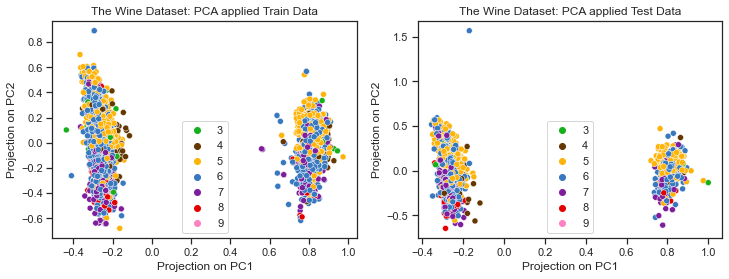

In [122]:
# Apply dimensionality reduction to the training data
X_train_pca = pca.transform(X_train)
# Apply dimensionality reduction to the test data
X_test_pca = pca.transform(X_test)

# plot the 2d data
colors = ["green", "brown", "amber", "windows blue", "purple", "red", "pink"]
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,4))
sns.scatterplot(x=X_train_pca[:,0], y=X_train_pca[:,1], hue=y_train, ax=ax1, palette=sns.xkcd_palette(colors))

sns.scatterplot(x=X_test_pca[:,0], y=X_test_pca[:,1], hue=y_test, ax=ax2, palette=sns.xkcd_palette(colors))

ax1.set_xlabel("Projection on PC1")
ax1.set_ylabel("Projection on PC2")
ax2.set_xlabel("Projection on PC1")
ax2.set_ylabel("Projection on PC2")
ax1.set_title('The Wine Dataset: PCA applied Train Data')
ax2.set_title('The Wine Dataset: PCA applied Test Data')
plt.show()

By observing the plot we can see that there is no proper separation between the class levels of quality, and we can not differentiate between the classes clearly. In order to get better separability we need to use optimization techniques and different dimensionality reduction methods like LDA.

We have plotted the 2D graph of principle components for both train and test sets, just to show how accurately the PCA is performing and we observe that the pattern is very similar in test and train sets.

We can also see from the scale that some of the PCA values are negative, hence normalizing PCA data would be effective for further analysis.

### Linear Discriminant Analysis (LDA)

LDA is performed on the data using scikit learn [4], LDA makes assumptions about normally distributed classes and equal class covariances, and noralizing the data would ensure that these assumption are met. 

We select n_components to be 2, to get the two best components that explain the varaiation of the data very well.

In [123]:
# initialize LDA
lda = LDA(n_components=2).fit(X_train, y_train)
print("Variance:",lda.explained_variance_ratio_)
print("Total variance explained by LDA components is:", round(sum(list(lda.explained_variance_ratio_))*100, 2))

Variance: [0.87316801 0.08427369]
Total variance explained by LDA components is: 95.74


From the above varaince we can see that the data is explained very well and at a much higher rate than PCA, using 2 top LDA components.

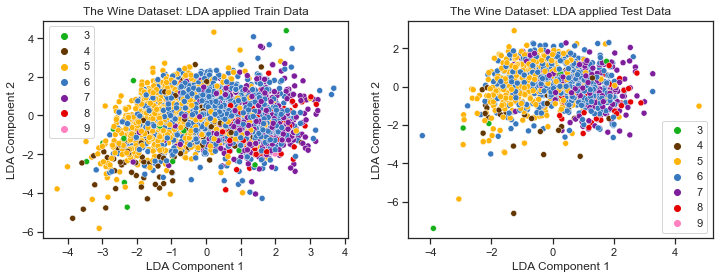

In [124]:
# Apply dimensionality reduction to the training data
X_train_lda = lda.transform(X_train)
# Apply dimensionality reduction to the test data
X_test_lda = lda.transform(X_test)

# plot the 2d data
colors = ["green", "brown", "amber", "windows blue", "purple", "red", "pink"]
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,4))
sns.scatterplot(x=X_train_lda[:,0], y=X_train_lda[:,1], hue=y_train, ax=ax1, palette=sns.xkcd_palette(colors))
sns.scatterplot(x=X_test_lda[:,0], y=X_test_lda[:,1], hue=y_test, ax=ax2, palette=sns.xkcd_palette(colors))

ax1.set_xlabel("LDA Component 1")
ax1.set_ylabel("LDA Component 2")
ax2.set_xlabel("LDA Component 1")
ax2.set_ylabel("LDA Component 2")
ax1.set_title('The Wine Dataset: LDA applied Train Data')
ax2.set_title('The Wine Dataset: LDA applied Test Data')
plt.show()

From above scatter plot we can say that, LDA is some what better when compared with PCA. However, classes were too close and it would be a problem when doing classification but when we compare with PCA it can give better classification accuracy. The reason that LDA performs better than PCA could be because LDA is useful when the data samples are high and PCA is useful when the samples are less.

We can also see from the scale that some of the LDA values are negative, hence normalizing LDA data would be effective for further analysis.

### t-SNE

T-distributed Stochastic Neighbor Embedding is performed on the data using sklearn [5]. T-SNE is used for visualizing highly dimensional data, by mapping the data points into a low dimensional embedded space. Also, we noted that T-SNE is computationally more complex slower than PCA and LDA.

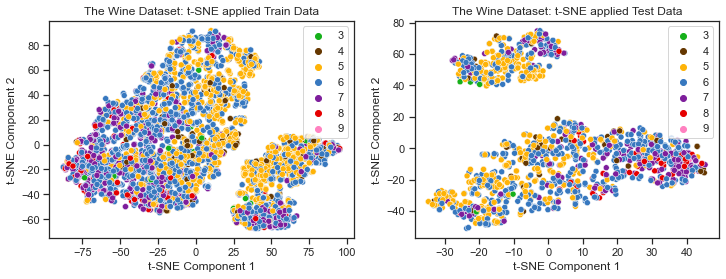

In [125]:
X_train_tsne = TSNE(n_components=2,learning_rate=200, init='random', random_state=27).fit_transform(X_train)
X_test_tsne = TSNE(n_components=2,learning_rate=200, init='random', random_state=27).fit_transform(X_test)

# plot the 2d t-SNE data
colors = ["green", "brown", "amber", "windows blue", "purple", "red", "pink"]
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,4))
sns.scatterplot(x=X_train_tsne[:,0], y=X_train_tsne[:,1], hue=y_train, ax=ax1, palette=sns.xkcd_palette(colors))
sns.scatterplot(x=X_test_tsne[:,0], y=X_test_tsne[:,1], hue=y_test, ax=ax2, palette=sns.xkcd_palette(colors))

ax1.set_xlabel("t-SNE Component 1")
ax1.set_ylabel("t-SNE Component 2")
ax2.set_xlabel("t-SNE Component 1")
ax2.set_ylabel("t-SNE Component 2")
ax1.set_title('The Wine Dataset: t-SNE applied Train Data')
ax2.set_title('The Wine Dataset: t-SNE applied Test Data')
plt.show()

The class level separation is not great using T-SNE, though the clouds are separated. 

In all the dimensionality reduction techniques, the plots of the reduced 2D data shows that there doesn't appear to be a very good separation between the 7 different classes. Out of the three methods tried above, the LDA seems to give nicely separating classes in the 2-dimensional space.

### PCA scree-plot

Scree plot [6], is one of the simplest ways to visualize the amount of variance i.e change in the data that is explained by each of the principle components of the PCA. We performed PCA on entire data without reducing number of components to look at the total varaince in scree plot.

We can see from the plot that most of the variation is explained by the top two principle components.

[0.61736708 0.16180592 0.06461691 0.04377396 0.03418638 0.02300792
 0.01755142 0.01451338 0.0130418  0.00496226 0.00410178 0.00107119]


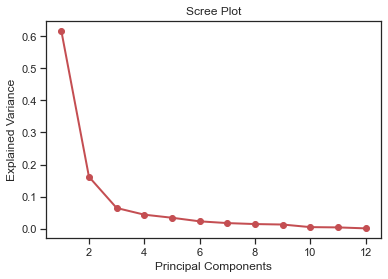

In [126]:
# Apply PCA with full dimension as target
pca = PCA().fit(X_train)
var_ratio = pca.explained_variance_ratio_
print(var_ratio)

plt.plot(range(1, len(var_ratio)+1), var_ratio, 'ro-', linewidth=2)
plt.title('Scree Plot')
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance') 
plt.show() 

### kNN Classifier

Finding best value of k for the wine dataset. From Assignment-1 we obtained the Manhatan distance with z-score normalization performs better.

we ran the classifier again with the same metric but for our now min-max normalized data, we observed from the below graph that the highest accuracy obtained is about 68.8% for k=40. 

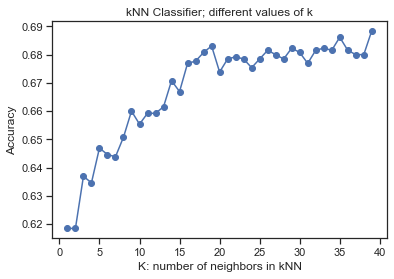

In [127]:
accuracies = []
K = range(1, 40)
for k in K:
    knn_clf = KNeighborsClassifier(n_neighbors=k, p=1, metric='manhattan', weights='distance').fit(X_train, y_train)
    acc = knn_clf.score(X_test, y_test)
    accuracies.append(acc)

plt.plot(K, accuracies, 'bo-')
plt.xlabel('K: number of neighbors in kNN')
plt.ylabel('Accuracy')
plt.title('kNN Classifier; different values of k')
plt.show()

### PCA + kNN
Finding the best dimensionality for PCA analysis with the kNN classifier using the above obtained best k-value and metric settings. 

[0.63, 0.6484615384615384, 0.6615384615384615, 0.6861538461538461, 0.6861538461538461, 0.6946153846153846, 0.6853846153846154, 0.6861538461538461, 0.693076923076923, 0.6861538461538461, 0.6861538461538461]


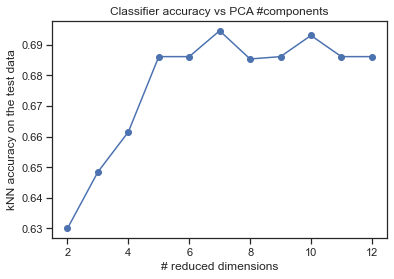

In [128]:
# Masntattan metric is used
# try PCA dimensions from 2 to 13
dimensions = list(range(2, 13))
accuracies = []
for d in dimensions:
    # Apply PCA on both the train & test data
    pca = PCA(n_components=d).fit(X_train)
    X_train_pca = pca.transform(X_train)
    X_test_pca = pca.transform(X_test)
    # create a knn classifier, train on the PCA reduced data & test accuracy
    knn_clf = KNeighborsClassifier(n_neighbors=40, weights='distance', metric='manhattan').fit(X_train_pca, y_train)
    acc = knn_clf.score(X_test_pca, y_test)
    accuracies.append(acc)

print(accuracies)  
# Plot the accuracy curve
plt.plot(dimensions, accuracies, 'bo-')
plt.xlabel('# reduced dimensions')
plt.ylabel('kNN accuracy on the test data')
plt.title('Classifier accuracy vs PCA #components')
plt.show()

The kNN classifier when trained and tested with a PCA reduced dimension of 7, gives high accuracy of about 69.4%. which is a bit higher than the value obtained for knn on the original data set.

Now applying PCA with n_components=7 and storing it as pca-wine data on which we will perform further analysis.

In [129]:
# Get the best PCA dataset
# Apply PCA on both the full wine data
pca_wine = PCA(n_components=7)
X_wine_pca_train = pca_wine.fit_transform(X_train)
X_wine_pca_test = pca_wine.transform(X_test)

### LDA + kNN
Note that the maximum allowed value of number of dimensions in LDA has to be <= min(num_classes-1, num_features), which is 6 for the wine dataset. And hence, analysing LDA performance for best knn setting obatined above, to reduce the dimensions of the data.

[0.6561538461538462, 0.6630769230769231, 0.6615384615384615, 0.6723076923076923, 0.6738461538461539]


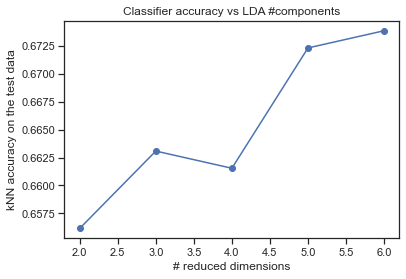

In [130]:
# Masntattan metric is used
# try LDA dimensions from 2 to 7
dimensions = list(range(2, 7))
accuracies = []
for d in dimensions:
    # Apply LDA on both the train & test data
    lda = LDA(n_components=d).fit(X_train,y_train)
    X_train_lda = lda.transform(X_train)
    X_test_lda = lda.transform(X_test)
    # create a knn classifier, train on the LDA reduced data & test accuracy
    knn_clf = KNeighborsClassifier(n_neighbors=40, weights='distance', metric='manhattan').fit(X_train_lda, y_train)
    acc = knn_clf.score(X_test_lda, y_test)
    accuracies.append(acc)

print(accuracies)  
# Plot the accuracy curve
plt.plot(dimensions, accuracies, 'bo-')
plt.xlabel('# reduced dimensions')
plt.ylabel('kNN accuracy on the test data')
plt.title('Classifier accuracy vs LDA #components')
plt.show()

We see from the plot that maximum accuracy for LDA on wine data is obtained for 6 dimensions. Hence, we are applying LDA with n_components=6 and storing it for LDA-wine data for further analysis.

In [131]:
# Apply LDA on the full wine data with reduced dimensions = 6
lda_wine = LDA(n_components=6)
X_wine_lda_train = lda_wine.fit_transform(X_train, y_train)
X_wine_lda_test = lda_wine.transform(X_test)

### kNN (with 5-fold Cross Validation)

We choose k=40 and metric as manhattan as previously we obtained best results from these values and performed 5-fold cross validation on the normalized dataset, PCA data set and LDA datasets. This is done in order to compare the results for naive bayes.

In [132]:
# 5-fold cross validation on the raw data

knn = KNeighborsClassifier(n_neighbors=40, weights='distance', p=1, metric='manhattan')
scores = cross_val_score(knn, X_train, y_train, cv=5)

print('Maximum Accuracy is: %.3f'%(max(scores)))
print('Avg accuracy of kNN on the full Wine data = %.3f'%(np.mean(scores)))

Maximum Accuracy is: 0.673
Avg accuracy of kNN on the full Wine data = 0.657


In [133]:
# 5-fold cross validation on the PCA data

knn = KNeighborsClassifier(n_neighbors=40, weights='distance', p=1, metric='manhattan')
scores = cross_val_score(knn, X_wine_pca_train , y_train, cv=5)

print('Maximum Accuracy is: %.3f'%(max(scores)))
print('Avg accuracy of kNN on the PCA Wine data = %.3f'%(np.mean(scores)))

Maximum Accuracy is: 0.656
Avg accuracy of kNN on the PCA Wine data = 0.644


In [134]:
# 5-fold cross validation on the PCA data

knn = KNeighborsClassifier(n_neighbors=40, weights='distance', p=1, metric='manhattan')
scores = cross_val_score(knn, X_wine_lda_train , y_train, cv=5)

print('Maximum Accuracy is: %.3f'%(max(scores)))
print('Avg accuracy of kNN on the LDA Wine data = %.3f'%(np.mean(scores)))

Maximum Accuracy is: 0.674
Avg accuracy of kNN on the LDA Wine data = 0.651


We look at the mean scores to compare the performance using 5-fold cross validation and we see that the RAW data has the higher mean accuracy than LDA and PCA.

## 2 Naive Bayes Classifier

Naive Bayes assumes the conditional independence of features [7]. MAP (Maximum aposteriori) estimate can be used to obtain the prior distribution and train the model on naive bayes. Based on this distribution, there are different naive bayes classifiers.

### Gaussian Naive Bayes.

Gaussian Naive Bayes [8], is when the prior is assumed to be gaussian distribution. Gaussian Naive Bayes is known to work well with continuous data.

We are performing 5-fold cross validation on our naive bayes methods and comparing with the previous results.

In [135]:
# Normalize the data using min-max normalization
Scaler = preprocessing.MinMaxScaler()
Scaler.fit(X_wine_pca_train)

X_wine_pca_train = Scaler.transform(X_wine_pca_train)
X_wine_pca_test = Scaler.transform(X_wine_pca_test)

In [136]:
# Normalize the data using min-max normalization
Scaler = preprocessing.MinMaxScaler()
Scaler.fit(X_wine_lda_train)

X_wine_lda_train = Scaler.transform(X_wine_lda_train)
X_wine_lda_test = Scaler.transform(X_wine_lda_test)

In [137]:
gnb = GaussianNB()
scores = cross_val_score(gnb, X_train, y_train, cv=5)

print('Avg accuracy of Naive Bayes on the full Wine data = %.3f'%(np.mean(scores)))
print('Maximum Accuracy is: %.3f'%(max(scores)))

gnb = GaussianNB().fit(X_train, y_train)
print("Test Accuracy: ",gnb.score(X_test, y_test))

Avg accuracy of Naive Bayes on the full Wine data = 0.375
Maximum Accuracy is: 0.423
Test Accuracy:  0.3346153846153846


In [138]:
gnb = GaussianNB()
scores = cross_val_score(gnb, X_wine_pca_train , y_train, cv=5)
print('Avg accuracy of Naive Bayes on the PCA Wine data = %.3f'%(np.mean(scores)))
print('Maximum Accuracy is: %.3f'%(max(scores)))

gnb = GaussianNB().fit(X_wine_pca_train, y_train)
print("Test Accuracy: ",gnb.score(X_wine_pca_test, y_test))

Avg accuracy of Naive Bayes on the PCA Wine data = 0.518
Maximum Accuracy is: 0.528
Test Accuracy:  0.5015384615384615


In [139]:
gnb = GaussianNB()
scores = cross_val_score(gnb, X_wine_lda_train , y_train, cv=5)
print('Avg accuracy of Naive Bayes on the LDA Wine data = %.3f'%(np.mean(scores)))
print('Maximum Accuracy is: %.3f'%(max(scores)))

gnb = GaussianNB().fit(X_wine_lda_train, y_train)
print("Test Accuracy: ",gnb.score(X_wine_lda_test, y_test))

Avg accuracy of Naive Bayes on the LDA Wine data = 0.531
Maximum Accuracy is: 0.545
Test Accuracy:  0.5376923076923077


Looking at the above mean accuracies, and comparing with knn results obatianed in previously, we see that accuracies for Raw-wine data, PCA and LDA wine data are higher for knn classifier rather than gaussian naive bayes.

### Multinomial Naive Bayes:

Multinomial Naive Bayes [9], simply assumes the distribution to be of multinomial in nature. It is known to work best for discrete data.

We need to normalize PCA and LDA data before applying Multinomial naive bayes because it would not work for values that are not positive i.e values that are not above zero. Same for complement naive bayes which is an extension of multinomial naive bayes. And so normalization has been done above in order to ensure consistency of the results.

In [24]:
mnb = MultinomialNB()
scores = cross_val_score(mnb, X_train, y_train, cv=5)
print('Avg accuracy of Multinomial Naive Bayes on the full Wine data = %.3f'%(np.mean(scores)))
print('Maximum Accuracy is: %.3f'%(max(scores)))

mnb = MultinomialNB().fit(X_train, y_train)
print("Test Accuracy: ",mnb.score(X_test, y_test))

Avg accuracy of Multinomial Naive Bayes on the full Wine data = 0.474
Maximum Accuracy is: 0.480
Test Accuracy:  0.4715384615384615


In [25]:
mnb = MultinomialNB()
scores = cross_val_score(mnb, X_wine_pca_train , y_train, cv=5)
print('Avg accuracy of Multinomial Naive Bayes on the PCA Wine data = %.3f'%(np.mean(scores)))
print('Maximum Accuracy is: %.3f'%(max(scores)))

mnb = MultinomialNB().fit(X_wine_pca_train, y_train)
print("Test Accuracy: ",mnb.score(X_wine_pca_test, y_test))

Avg accuracy of Multinomial Naive Bayes on the PCA Wine data = 0.436
Maximum Accuracy is: 0.437
Test Accuracy:  0.43846153846153846


In [26]:
mnb = MultinomialNB()
scores = cross_val_score(mnb, X_wine_lda_train , y_train, cv=5)
print('Avg accuracy of Multinomial Naive Bayes on the LDA Wine data = %.3f'%(np.mean(scores)))
print('Maximum Accuracy is: %.3f'%(max(scores)))

mnb = MultinomialNB().fit(X_wine_lda_train, y_train)
print("Test Accuracy: ",mnb.score(X_wine_lda_test, y_test))

Avg accuracy of Multinomial Naive Bayes on the LDA Wine data = 0.436
Maximum Accuracy is: 0.437
Test Accuracy:  0.43846153846153846


Gaussian naive bayes performs better for wine (raw/PCA/LDA) data than multinomial naive bayes. 

 ### Complement Naive Bayes
 
Complement Naive Bayes [9], is a variation of the multinomial naive bayes which is suitabel for unbalanced datasets. Since our data set is pretty unbalanced as seen from Assignment-1, due to variation in sample distribution for color, we are interested in looking at the results of Complement Naive Bayes. 

In [27]:
cnb = ComplementNB()
scores = cross_val_score(cnb, X_train, y_train, cv=5)
print('Avg accuracy of Complement Naive Bayes on the full Wine data = %.3f'%(np.mean(scores)))
print('Maximum Accuracy is: %.3f'%(max(scores)))

cnb = ComplementNB().fit(X_train, y_train)
print("Test Accuracy: ",cnb.score(X_test, y_test))

Avg accuracy of Complement Naive Bayes on the full Wine data = 0.406
Maximum Accuracy is: 0.432
Test Accuracy:  0.4146153846153846


In [28]:
cnb = ComplementNB()
scores = cross_val_score(cnb, X_wine_pca_train , y_train, cv=5)
print('Avg accuracy of Complement Naive Bayes on the PCA Wine data = %.3f'%(np.mean(scores)))
print('Maximum Accuracy is: %.3f'%(max(scores)))

cnb = ComplementNB().fit(X_wine_pca_train, y_train)
print("Test Accuracy: ",cnb.score(X_wine_pca_test, y_test))

Avg accuracy of Complement Naive Bayes on the PCA Wine data = 0.448
Maximum Accuracy is: 0.471
Test Accuracy:  0.4576923076923077


In [29]:
cnb = ComplementNB()
scores = cross_val_score(cnb, X_wine_lda_train , y_train, cv=5)
print('Avg accuracy of Complement Naive Bayes on the LDA Wine data = %.3f'%(np.mean(scores)))
print('Maximum Accuracy is: %.3f'%(max(scores)))

cnb = ComplementNB().fit(X_wine_lda_train, y_train)
print("Test Accuracy: ",cnb.score(X_wine_lda_test, y_test))

Avg accuracy of Complement Naive Bayes on the LDA Wine data = 0.439
Maximum Accuracy is: 0.455
Test Accuracy:  0.4346153846153846


We observe there is not much difference between multinomial and complement naive bayes.

Forming a table that compares various mean cross validation accuracies for the datasets. We can see that the best set of accuracies is obtained for KNN classification only and naive bayes doesn't perform well on our datasets even for the reduced dimensions.

#### Average 5-fold CV accuracies for Wine Dataset
|Classifier  | Setting   | wine-raw      | wine-pca    | wine-lda      |
|------------|-----------|---------------|-------------|---------------|
|kNN         | k = 40, CV=5     | 65.7 | 64.4 | 65.1 |
|Naive Bayes|GaussianNB, k = 40, CV=5 | 37.5 | 51.8 | 53.1|
|Multinomial Naive Bayes|MultinomialNB, k = 40, CV=5 | 47.4 | 43.6 | 43.6 |
|Complement Naive Bayes|ComplementNB,k = 40, CV=5 | 40.6 | 44.8 | 43.9 |


## 3 Decision Trees Classifier

Decision Trees are a non-parametric supervised learning method used for classification and regression. The goal is to create a model that predicts the value of a target variable by learning simple decision rules inferred from the data features. A tree can be seen as a piecewise constant approximation.

Decision Tree classifier is performed on our data using scikit learn [13]. Here we have selected max_depth to be the parameter, leaving the rest at default modes and GridSearch is used for 5 fold cross validation to find the best value of the parameter.

### Decision Tree on Raw Wine Data

The theoretical maximum depth a decision tree can achieve is one less than the number of training samples, but no algorithm will let you reach this point for obvious reasons, one big reason being overfitting [18]. Hence we are choosing a set of values for depth and using GridSearchCV to obtain the best maximum depth for our decision tree.

In [140]:
DT_clf = DecisionTreeClassifier(random_state=27)
depths = [2, 3, 4, 5, 10, 15, 20, 25, 30, 35, 45, 50]
parameters = {'max_depth': depths}
clf = GridSearchCV(DT_clf, parameters, cv=5).fit(X_train, y_train)
print(clf.best_params_)

{'max_depth': 30}


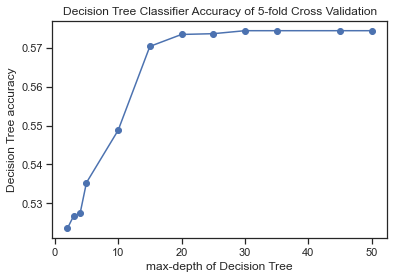

In [141]:
plt.plot(depths, clf.cv_results_['mean_test_score'], 'bo-')
plt.xlabel('max-depth of Decision Tree')
plt.ylabel('Decision Tree accuracy')
plt.title('Decision Tree Classifier Accuracy of 5-fold Cross Validation')
plt.show() 

We see from the plot that the best accuracy is obtained when max_depth of the decision tree is 30. And hence we fit the model once again for the best parameter settings and observe the test accuracy.

In [142]:
best_clf = DecisionTreeClassifier(max_depth=30, random_state=27).fit(X_train, y_train)
acc = best_clf.score(X_test,y_test)
print("Training accuracy for the best fit model is: %.3f"%acc)

Training accuracy for the best fit model is: 0.597


In [33]:
#visualizing the decision tree to analyse splitting rules
features = X_train.columns.tolist()
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (72,36), dpi=300)
tree.plot_tree(best_clf,feature_names=features,filled=True,fontsize=7,rounded=True)
plt.show()

- The Decition Tree visualization essentially represents the features and the values of the said feature that were used to split the data and form branches. The last node without any split acts as the leaf node. And the minimum number of samples required to be at a leaf node = 1 in default case.

- Since we used default values, the function to measure the quality of a split is taken as gini impurity value. The higher value of gini impurity indicates that the node is impure and hence it can be further split. The best split is done on the node until lowest (or 0) value of Gini impurity is reached, as it means that the node will be pure [17].

- The graph starts by taking alcohol <= 0.341 as root node, that is split into alcohol <= 0.56 on the right (i.e the value if alcohol is > 0.341) and if it is less then the samples are split using volatile_acidity as a criterion. And this splitting goes on.

- Also, most of the features that were used to split the data are Alcohol, Volatile Acidity, Sulphates, Free sulpher dioxide, Chlorides, citric acid, residual sugar and density.

- From the plot, we can see that the tree is complex and features have been reused many times to split the data samples. Also when we look at the leaf nodes, we saw that the nodes were split multiple times until samples=1 for that particular node, which is not necessary.

- And hence even though the accuracy is higher for max depth of 30, max_depth of say 15 or 20 instead of 30 could be enough to look at.

### Decision Tree on PCA Wine Data

Performing Decision Tree analysis on PCA Wine Data and using GridSearchCV to obtain the best parameters for the model.

In [143]:
# DT on the PCA dataset
DT_clf = DecisionTreeClassifier(random_state=27)
depths = [2, 3, 4, 5, 10, 15, 20, 25, 30, 35, 45, 50]
parameters = {'max_depth': depths}
clf = GridSearchCV(DT_clf, parameters, cv=5).fit(X_wine_pca_train , y_train)
print(clf.best_params_)

{'max_depth': 25}


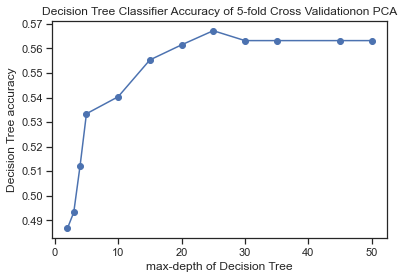

In [144]:
plt.plot(depths, clf.cv_results_['mean_test_score'], 'bo-')
plt.xlabel('max-depth of Decision Tree')
plt.ylabel('Decision Tree accuracy')
plt.title('Decision Tree Classifier Accuracy of 5-fold Cross Validationon PCA')
plt.show() 

We see from the plot that the best accuracy is obtained when max_depth of the decision tree is 25. And hence we fit the model once again for the best parameter settings to report the test accuracy.

In [145]:
best_clf = DecisionTreeClassifier(max_depth=25, random_state=27).fit(X_wine_pca_train, y_train)
acc = best_clf.score(X_wine_pca_test,y_test)
print("Test accuracy for the best fit mdoel is: %.3f"%acc)

Training accuracy for the best fit mdoel is: 0.581


### Decision Tree on LDA Wine Data

Performing Decision Tree analysis on LDA Wine Data and using GridSearchCV to obtain the best parameters for the model.

In [146]:
# DT on the LDA dataset
DT_clf = DecisionTreeClassifier(random_state=27)
depths = [2, 3, 4, 5, 10, 15, 20, 25, 30, 35, 45, 50]
parameters = {'max_depth': depths}
clf = GridSearchCV(DT_clf, parameters, cv=5).fit(X_wine_lda_train , y_train)
print(clf.best_params_)

{'max_depth': 30}


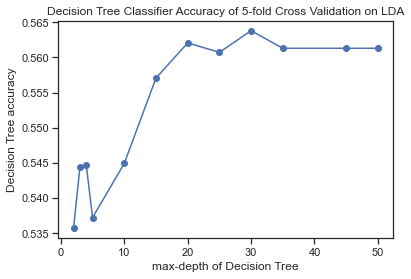

In [147]:
plt.plot(depths, clf.cv_results_['mean_test_score'], 'bo-')
plt.xlabel('max-depth of Decision Tree')
plt.ylabel('Decision Tree accuracy')
plt.title('Decision Tree Classifier Accuracy of 5-fold Cross Validation on LDA')
plt.show() 

We see from the plot that the best accuracy is obtained when max_depth of the decision tree is 30. And hence we fit the model once again for the best parameter settings to report the test accuracy.

In [148]:
best_clf = DecisionTreeClassifier(max_depth=30, random_state=27).fit(X_wine_lda_train, y_train)
acc = best_clf.score(X_wine_lda_test,y_test)
print("Training accuracy for the best fit mdoel is: %.3f"%acc)

Training accuracy for the best fit mdoel is: 0.577


## 4 Random Forest Classifier

The random forest is a classification algorithm consisting of many decisions trees. It uses bagging and feature randomness when building each individual tree to try to create an uncorrelated forest of trees whose prediction by committee is more accurate than that of any individual tree. [14]

Random forest classifier is performed on the data using scikit learn [15].

### Random Forest Classification on raw wine dataset
Performing Random Forest Classification on raw wine dataset to obtain best set of parameters.

Here we are choosing max_depth and n_estimators i.e numer of trees to be the parameters that need to be tuned. The more trees, the less likely the algorithm is to overfit. Although larger number of trees maybe better, but will take much longer to compute, additionlly the results will stop getting significantly better beyond a critical number of trees. 

In [156]:
RF_clf = RandomForestClassifier(random_state=27)
depths = [2, 3, 4, 5, 10, 15, 20, 25, 30]
n_trees = [3, 5, 10, 20, 50, 100, 150, 200, 250, 300]
parameters = {'n_estimators': n_trees, 'max_depth':depths}
clf = GridSearchCV(RF_clf, parameters, cv=5).fit(X_train, y_train)

print(clf.best_params_)

{'max_depth': 25, 'n_estimators': 250}


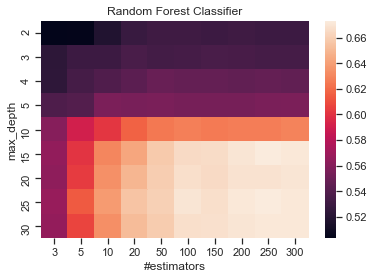

In [157]:
grid_results = clf.cv_results_['mean_test_score'].reshape([len(depths), len(n_trees)])
sns.heatmap(grid_results, xticklabels=n_trees, yticklabels=depths)
plt.ylabel('max_depth')
plt.xlabel('#estimators')
plt.title('Random Forest Classifier')
plt.show()

We see from the heat plot that the best accuracy is obtained when max_depth is 25 and number of trees are 250. And hence we fit the model once again for the best parameter settings and observe the test accuracy.

In [158]:
best_clf = RandomForestClassifier(max_depth=25, n_estimators=250, random_state=27).fit(X_train, y_train)
acc = best_clf.score(X_test,y_test)
print("Training accuracy for the best fit model is: %.3f"%acc)

Training accuracy for the best fit model is: 0.692


### Performing Random Forest Classification on PCA wine dataset.

Performing Random Forest Classification on PCA reduced wine dataset to obtain best set of parameters. The parameters have been defined in the above code, so we are just using max_depth and n_estimators for our analysis and using default settings for any other parameters, to keep the results consistant across the datasets for comparision purpose.

In [159]:
# RF on the PCA dataset
clf = GridSearchCV(RF_clf, parameters, cv=5).fit(X_wine_pca_train , y_train)
print(clf.best_params_)

{'max_depth': 20, 'n_estimators': 300}


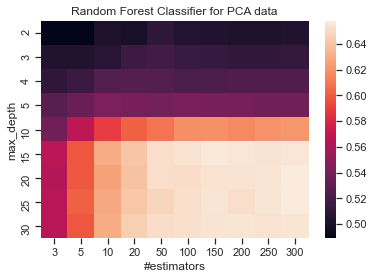

In [160]:
grid_results = clf.cv_results_['mean_test_score'].reshape([len(depths), len(n_trees)])
sns.heatmap(grid_results, xticklabels=n_trees, yticklabels=depths)
plt.ylabel('max_depth')
plt.xlabel('#estimators')
plt.title('Random Forest Classifier for PCA data')
plt.show()

We see from the heat plot that the best accuracy is obtained when max_depth is 20 and number of trees are 300. And hence we fit the model once again on PCA dataset for the best parameter settings and observe the test accuracy.

In [161]:
best_clf = RandomForestClassifier(max_depth=20, n_estimators=300, random_state=27).fit(X_wine_pca_train, y_train)
acc = best_clf.score(X_wine_pca_test,y_test)
print("Test accuracy for the best fit PCA model is: %.3f"%acc)

Test accuracy for the best fit PCA model is: 0.684


### Performing Random Forest Classification on LDA wine dataset.
Repeating Random Forest Classification on LDA wine dataset.

In [162]:
# RF on the LDA dataset
clf = GridSearchCV(RF_clf, parameters, cv=5).fit(X_wine_lda_train , y_train)
print(clf.best_params_)

{'max_depth': 25, 'n_estimators': 250}


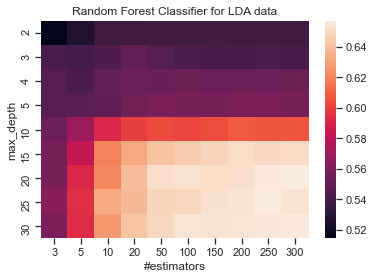

In [163]:
grid_results = clf.cv_results_['mean_test_score'].reshape([len(depths), len(n_trees)])
sns.heatmap(grid_results, xticklabels=n_trees, yticklabels=depths)
plt.ylabel('max_depth')
plt.xlabel('#estimators')
plt.title('Random Forest Classifier for LDA data')
plt.show()

We see from the heat plot that the best accuracy is obtained when max_depth is 25 and number of trees are 250. And hence we fit the model once again on LDA dataset for the best parameter settings and observe the test accuracy.

In [164]:
best_clf = RandomForestClassifier(max_depth=25, n_estimators=250, random_state=27).fit(X_wine_lda_train, y_train)
acc = best_clf.score(X_wine_lda_test,y_test)
print("Test accuracy for the best fit LDA model is: %.3f"%acc)

Test accuracy for the best fit LDA model is: 0.683


## 5 Gradient Tree Boosting

Boosting is a method of converting weak learners into strong learners. In boosting, each new tree is a fit on a modified version of the original data set.

Gradient Boosting is used on the data using scikit learn [16].

### Gradient Tree Boosting on raw wine dataset

Performing Gradient Tree Boosting on raw wine dataset to obtain best set of parameters.

Here we are choosing max_depth and n_estimators i.e numer of trees to be the parameters that need to be tuned. We have defines a set of values for our max_depth and n_estimators in the above code and we are using those for hyper parameter tuning of gradient tree boosting.

In [166]:
#Gradient Tree Boosting on raw wine dataset
GB_clf = GradientBoostingClassifier(random_state=27)
depths = [2, 3, 4, 5, 10, 15, 20, 25]
n_trees = [3, 5, 10, 20, 50, 100, 150]
parameters = {'n_estimators': n_trees, 'max_depth':depths}
clf = GridSearchCV(GB_clf, parameters, verbose=0, cv=5).fit(X_train, y_train)
print(clf.best_params_)

{'max_depth': 15, 'n_estimators': 150}


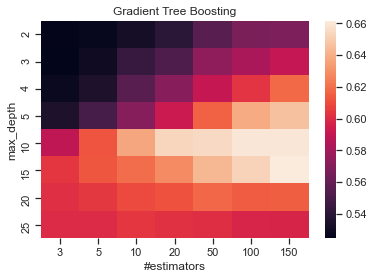

In [167]:
grid_results = clf.cv_results_['mean_test_score'].reshape([len(depths), len(n_trees)])
sns.heatmap(grid_results, xticklabels=n_trees, yticklabels=depths)
plt.ylabel('max_depth')
plt.xlabel('#estimators')
plt.title('Gradient Tree Boosting')
plt.show()

We see from the heat plot that the best accuracy is obtained when max_depth is 15 and number of trees are 150. And hence we fit the model once again for the best parameter settings and observe the test accuracy.

In [168]:
best_clf = GradientBoostingClassifier(max_depth=15, n_estimators=150, random_state=27).fit(X_train, y_train)
acc = best_clf.score(X_test,y_test)
print("Test accuracy for the best fit model is: %.3f"%acc)

Test accuracy for the best fit model is: 0.690


### Gradient Tree Boosting on PCA wine dataset

In [169]:
# on the PCA data
GB_clf = GradientBoostingClassifier(random_state=27)
n_trees = [3, 5, 10, 20, 50, 100, 150]
depths = [2, 3, 4, 5, 10, 15, 20]
parameters = {'n_estimators': n_trees, 'max_depth':depths}
clf = GridSearchCV(GB_clf, parameters, cv=5).fit(X_wine_pca_train , y_train)
print(clf.best_params_)

{'max_depth': 15, 'n_estimators': 150}


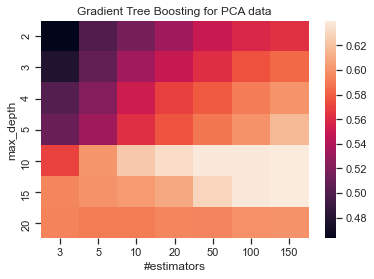

In [170]:
grid_results = clf.cv_results_['mean_test_score'].reshape([len(depths), len(n_trees)])
sns.heatmap(grid_results, xticklabels=n_trees, yticklabels=depths)
plt.ylabel('max_depth')
plt.xlabel('#estimators')
plt.title('Gradient Tree Boosting for PCA data')
plt.show()

We see from the heat plot that the best accuracy is obtained when max_depth is 15 and number of trees are 150. And hence we fit the model once again for the best parameter settings and observe the test accuracy.

In [171]:
best_clf = GradientBoostingClassifier(max_depth=15, n_estimators=150, random_state=27).fit(X_wine_pca_train, y_train)
acc = best_clf.score(X_wine_pca_test,y_test)
print("Test accuracy for the best fit PCA model is: %.3f"%acc)

Test accuracy for the best fit PCA model is: 0.657


### Gradient Tree Boosting on LDA wine dataset

In [172]:
# on the LDA data
GB_clf = GradientBoostingClassifier(random_state=27)
n_trees = [3, 5, 10, 20, 50, 100, 150]
depths = [2, 3, 4, 5, 10, 15]
parameters = {'n_estimators': n_trees, 'max_depth':depths}
clf = GridSearchCV(GB_clf, parameters, cv=5).fit(X_wine_lda_train , y_train)
print(clf.best_params_)

{'max_depth': 15, 'n_estimators': 150}


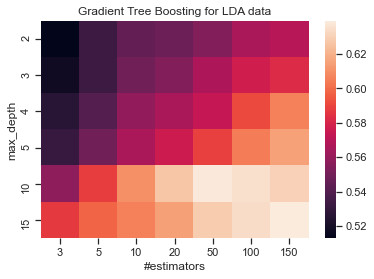

In [173]:
grid_results = clf.cv_results_['mean_test_score'].reshape([len(depths), len(n_trees)])
sns.heatmap(grid_results, xticklabels=n_trees, yticklabels=depths)
plt.ylabel('max_depth')
plt.xlabel('#estimators')
plt.title('Gradient Tree Boosting for LDA data')
plt.show()

We see from the heat plot that the best accuracy is obtained when max_depth is 15 and number of trees are 150. And hence we fit the model once again for the best parameter settings and observe the test accuracy.

In [174]:
best_clf = GradientBoostingClassifier(max_depth=15, n_estimators=150, random_state=27).fit(X_wine_lda_train, y_train)
acc = best_clf.score(X_wine_lda_test,y_test)
print("Test accuracy for the best fit LDA model is: %.3f"%acc)

Test accuracy for the best fit LDA model is: 0.669


The analysis is repeated for PCA and LDA Wine data as well. And we see that gradient boosting classification performs much better and at a lower depth than Random Forest classification for all (raw/PCA/LDA) the three datasets. However, computational complexity and time are high.

# Abalone Dataset

Loading the Abalone dataset, Normalize the data and perform train, test split.

The Abalone dataset 4177 rows and 9 columns. There are 9 features there is 1 categorical data feature i.e 'Sex' while the rest are numeric features.

We are consedering Rings as a feature of interest and it has has 29 classes. This is a highly imbalanced dataset as the sample distribution for rings varies drastically as seen in Assignment-1.

In [175]:
# Abalone Dataset
# Columns i.e data features as seen in the abalone data set 
column_names = ["Sex","Length","Diameter","Height","Whole_Weight","Shucked_weight",
                "Viscera_weight","Shell_weight","Rings"]
# Loading the dataset
abalone = pd.read_csv("abalone.csv", header=None, names=column_names)

We are using one hot encoding to convert the categorical variable 'sex' having [M,F,I] categories into 0s and 1s.

In [176]:
# features
X_abalone = abalone.iloc[:, :-1]
# labels
y_abalone = abalone.iloc[:, -1]

X_abalone = pd.get_dummies(X_abalone, columns = ['Sex'])

Splitting the abalone data into testing (20%) and training (80%) sets and performing min-max normalization.

In [177]:
# Splitting the abalone data into testing (20%) and training (80%) sets.
X_train,X_test,y_train,y_test = train_test_split(X_abalone, y_abalone, random_state=27, test_size=0.20)

# min-max normalization 
Scaler = preprocessing.MinMaxScaler()
Scaler.fit(X_train)

X_train = Scaler.transform(X_train)
X_test = Scaler.transform(X_test)

## 1 Representation Learning
PCA vs LDA. Also t-SNE plot

### Principal Component Analysis (PCA)

Principal Component Analysis (PCA) with n_components=2, to obtain top two dimensions that explain the model very well. 

In [178]:
# Principal Component Analysis (PCA)
pca = PCA(n_components=2).fit(X_train)
print("Variance:",pca.explained_variance_ratio_)
print("Total variance explained by PCA components:%.2f%%"% round(sum(list(pca.explained_variance_ratio_))*100, 2))

Variance: [0.46981248 0.41694269]
Total variance explained by PCA components:88.68%


We see that about 88.6% of variation in the data is obtained by the top two PCA principle components. Now let us look at the scatter plot [20] that is plotted between principle components 1 and 2.

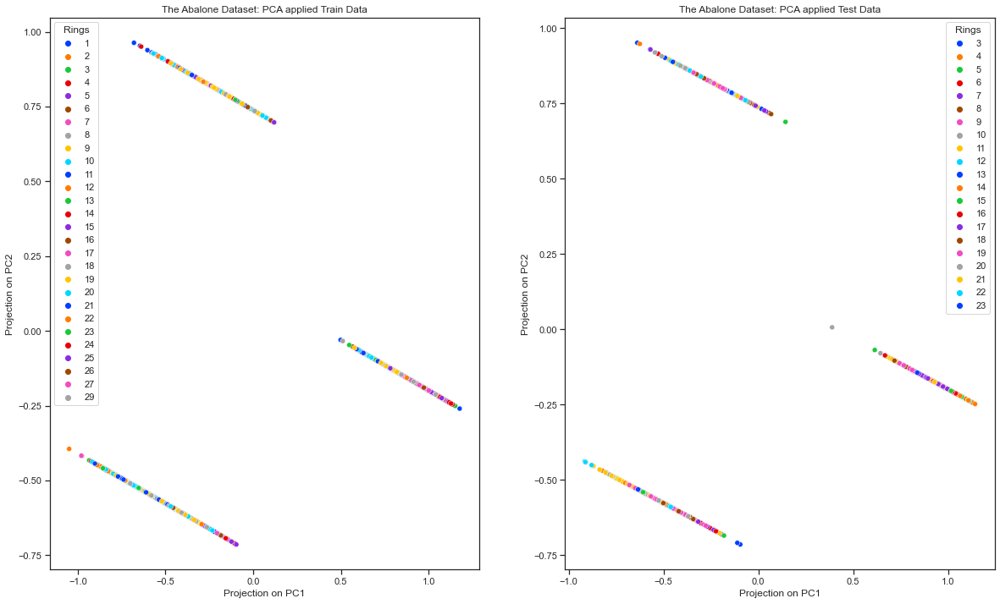

In [179]:
# Apply dimensionality reduction to the training data
X_train_pca = pca.transform(X_train)
# Apply dimensionality reduction to the test data
X_test_pca = pca.transform(X_test)

# plot the 2d data
# Palette [19] is set instead of passing color vector as the number of classes is pretty high
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,12))
sns.scatterplot(x=X_train_pca[:,0], y=X_train_pca[:,1], ax=ax1, palette="bright", hue=y_train,)
sns.scatterplot(x=X_test_pca[:,0], y=X_test_pca[:,1], hue=y_test, ax=ax2, palette="bright")

ax1.set_xlabel("Projection on PC1")
ax1.set_ylabel("Projection on PC2")
ax2.set_xlabel("Projection on PC1")
ax2.set_ylabel("Projection on PC2")
ax1.set_title('The Abalone Dataset: PCA applied Train Data')
ax2.set_title('The Abalone Dataset: PCA applied Test Data')
plt.show()

We can see that the classes are not separated clearly using PC1 and PC2 projections. And are repeated thrice, we suspect this is because of one hot encoding that we did earlier to include the categorical 'sex' variable. And PCA won't work well with categorical data. However, we choose to include the variable in the data as it might be useful for further analysis. 

### Linear Discriminant Analysis (LDA)
Linear Discriminant Analysis (LDA) with n_components = 2 is performed to obtain top 2 LDA components that explain data variance.

In [180]:
# initialize LDA
lda = LDA(n_components=2).fit(X_train, y_train)
print("Variance:",lda.explained_variance_ratio_)
print("Total variance explained by LDA components is:", round(sum(list(lda.explained_variance_ratio_))*100, 2))

Variance: [0.71481912 0.21778301]
Total variance explained by LDA components is: 93.26


From the above explained varaince ratio, we can see that the data is explained very well, at about 93.26% and at a higher rate than PCA, using 2 top LDA components.

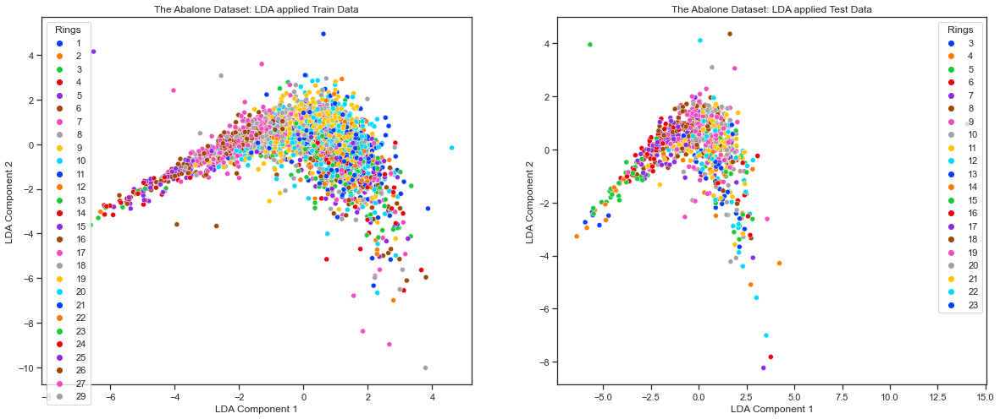

In [181]:
# Apply dimensionality reduction to the training data
X_train_lda = lda.transform(X_train)
# Apply dimensionality reduction to the test data
X_test_lda = lda.transform(X_test)

# plot the 2d data
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,8))
sns.scatterplot(x=X_train_lda[:,0], y=X_train_lda[:,1], hue=y_train, ax=ax1, palette="bright")
sns.scatterplot(x=X_test_lda[:,0], y=X_test_lda[:,1], hue=y_test, ax=ax2, palette="bright")

ax1.set_xlabel("LDA Component 1")
ax1.set_ylabel("LDA Component 2")
ax2.set_xlabel("LDA Component 1")
ax2.set_ylabel("LDA Component 2")
ax1.set_title('The Abalone Dataset: LDA applied Train Data')
ax2.set_title('The Abalone Dataset: LDA applied Test Data')
plt.show()

From above scatter plot we can say that, using LDA classes are some what distinguishable and better separated than PCA, but the classes are closer to each other.

We plotted the graph for both train and test sets just to show the variation in the pattern.

### t-SNE

t-SNE is performed for n_components=2 and the results for both train and test sets are plotted for comparision purposes.

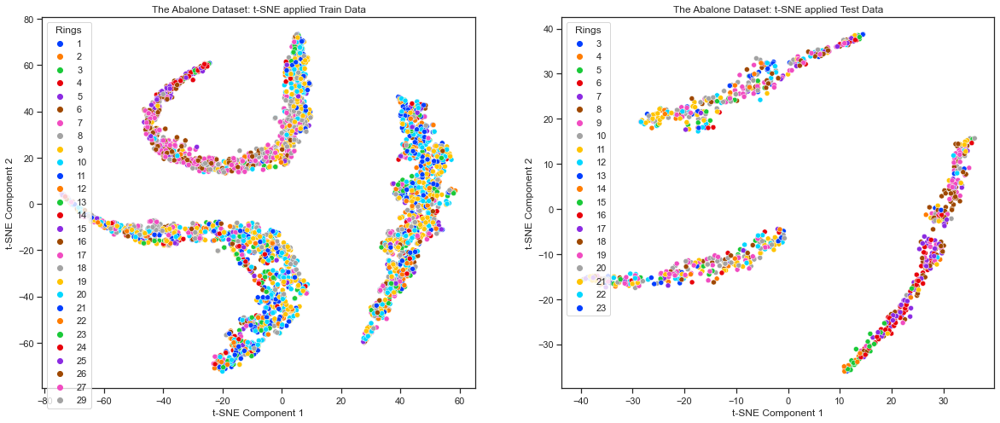

In [182]:
X_train_tsne = TSNE(n_components=2, learning_rate=200, init='random',random_state=27).fit_transform(X_train)
X_test_tsne = TSNE(n_components=2, learning_rate=200, init='random',random_state=27).fit_transform(X_test)

# plot the 2d t-SNE data
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,8))
sns.scatterplot(x=X_train_tsne[:,0], y=X_train_tsne[:,1], hue=y_train, ax=ax1, palette="bright")
sns.scatterplot(x=X_test_tsne[:,0], y=X_test_tsne[:,1], hue=y_test, ax=ax2, palette="bright")


ax1.set_xlabel("t-SNE Component 1")
ax1.set_ylabel("t-SNE Component 2")
ax2.set_xlabel("t-SNE Component 1")
ax2.set_ylabel("t-SNE Component 2")
ax1.set_title('The Abalone Dataset: t-SNE applied Train Data')
ax2.set_title('The Abalone Dataset: t-SNE applied Test Data')
plt.show()

The class separability is not clear using T-SNE. However, there are too many classes and it is a bit difficult to visualize and also we know that the dataset is imbalanced for the target feature 'rings'.

In all the dimensionality reduction techniques, the plots of the reduced 2D data doesn't show a very good separation between the classes. Only LDA seems to separate the classes a bit better but they are closely meshed.

### PCA scree-plot

The scree plot visualizes the eigen values of principle with respect to the feaures. We can see that the top 2 principle components are explaining the data very well, while adding 3rd and 4th components would give much higher prediction accuracy. However further increasing the components would not make any difference in the analysis.

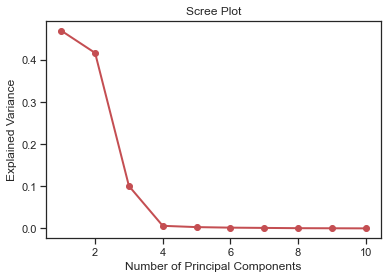

In [183]:
# Apply PCA with full dimension as target
pca = PCA().fit(X_train)
var_ratio = pca.explained_variance_ratio_

plt.plot(range(1, len(var_ratio)+1), var_ratio, 'ro-', linewidth=2)
plt.title('Scree Plot')
plt.xlabel('Number of Principal Components')
plt.ylabel('Explained Variance') 
plt.show() 

### kNN Classifier
Finding best value of k for the abalone dataset.

In Assignment-1 for abalone dataset, we got best accuracy for normalized dataset for knn with manhattan distance. When we re-ran the analysis, the highest accuracy is noticed to be at k=65 for manhattan distance with accuracy of about 27.8%.

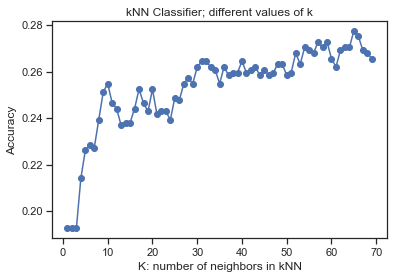

In [184]:
accuracies = []
K = range(1, 70)
for k in K:
    knn_clf = KNeighborsClassifier(n_neighbors=k,  weights='distance', p=1, metric='manhattan').fit(X_train, y_train)
    acc = knn_clf.score(X_test, y_test)
    accuracies.append(acc)
    
plt.plot(K, accuracies, 'bo-')
plt.xlabel('K: number of neighbors in kNN')
plt.ylabel('Accuracy')
plt.title('kNN Classifier; different values of k')
plt.show()

### PCA + kNN
For finding the best dimensionality for the kNN classifier, k=65 is used with manhattan distance metric. and the number of components n_components must be between 0 and min(n_samples, n_features) which is 10. 

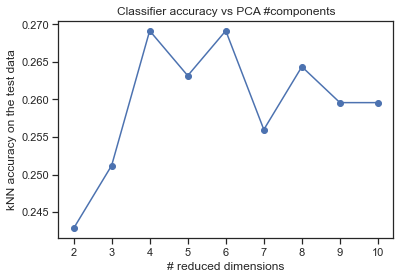

In [185]:
# The default is minkowski metric with p=2
# which is the same as the Euclidean distance
# try PCA dimensions from 2 to 10
dimensions = list(range(2, 11))
accuracies = []
for d in dimensions:
    # Apply PCA on both the train & test data
    pca = PCA(n_components=d).fit(X_train)
    X_train_pca = pca.transform(X_train)
    X_test_pca = pca.transform(X_test)
    # create a knn classifier, train on the PCA reduced data & test accuracy
    knn_clf = KNeighborsClassifier(n_neighbors=65, weights='distance', p=1, metric='manhattan').fit(X_train_pca, y_train)
    acc = knn_clf.score(X_test_pca, y_test)
    accuracies.append(acc)
    
# Plot the accuracy curve
plt.plot(dimensions, accuracies, 'bo-')
plt.xlabel('# reduced dimensions')
plt.ylabel('kNN accuracy on the test data')
plt.title('Classifier accuracy vs PCA #components')
plt.show()

Clearly, the kNN classifier when trained and test with a PCA reduced dimension of 4, gives better performance at 

In [186]:
# Get the best PCA dataset
# Apply PCA on both the full wine data
PCA = PCA(n_components=4)
X_abalone_pca_train = PCA.fit_transform(X_train)
X_abalone_pca_test = PCA.transform(X_test)

### LDA + kNN
Note that the only allowed maximum value of number of dimensions in LDA  has to be <= min(num_classes-1, num_features) which is 7 for the abalone dataset!

[0.2631578947368421, 0.24641148325358853, 0.28708133971291866, 0.28588516746411485, 0.2834928229665072, 0.26555023923444976]


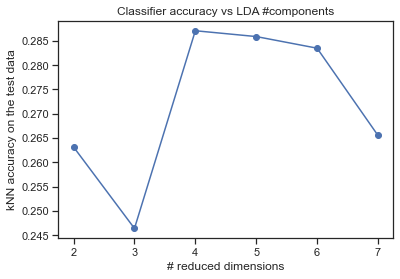

In [187]:
# Mantattan metric is used
# try LDA dimensions from 2 to 7
dimensions = list(range(2, 8))
accuracies = []
for d in dimensions:
    # Apply LDA on both the train & test data
    lda = LDA(n_components=d).fit(X_train,y_train)
    X_train_lda = lda.transform(X_train)
    X_test_lda = lda.transform(X_test)
    # create a knn classifier, train on the LDA reduced data & test accuracy
    knn_clf = KNeighborsClassifier(n_neighbors=65, weights='distance', metric='manhattan').fit(X_train_lda, y_train)
    acc = knn_clf.score(X_test_lda, y_test)
    accuracies.append(acc)

print(accuracies)  
# Plot the accuracy curve
plt.plot(dimensions, accuracies, 'bo-')
plt.xlabel('# reduced dimensions')
plt.ylabel('kNN accuracy on the test data')
plt.title('Classifier accuracy vs LDA #components')
plt.show()

Clearly, LDA also performs best with reduced dimension of 4.

In [188]:
# Apply LDA on the full ablone data and reduced dimensions is 4
lda_abalone = LDA(n_components=4)
X_abalone_lda_train = lda_abalone.fit_transform(X_train, y_train)
X_abalone_lda_test = lda_abalone.transform(X_test)

### kNN with 5-fold Cross Validation

We are performing 5-fold cross validation for KNN classifier to get the mean validation accuracy in order to make comparisions with naive bayes methods.

In [189]:
# 5-fold cross validation on the full data
knn = KNeighborsClassifier(n_neighbors=65, weights='distance', p=1, metric='manhattan')
scores = cross_validate(knn, X_train, y_train, cv=5, scoring='accuracy')

print("Avg accuracy of kNN on the full Abalone data: %.3f"%mean(scores['test_score']))

Avg accuracy of kNN on the full Abalone data: 0.257


In [190]:
# 5-fold cross validation on the PCA data
knn = KNeighborsClassifier(n_neighbors=65, weights='distance', p=1, metric='manhattan')
scores = cross_validate(knn, X_abalone_pca_train, y_train, cv=5, scoring='accuracy')
print("Avg accuracy of kNN on the full Abalone data: %.3f"%mean(scores['test_score']))

Avg accuracy of kNN on the full Abalone data: 0.228


In [191]:
# 5-fold cross validation on the LDA data
knn = KNeighborsClassifier(n_neighbors=65, weights='distance', p=1, metric='manhattan')
scores = cross_validate(knn, X_abalone_lda_train, y_train, cv=5, scoring='accuracy')
print("Avg accuracy of kNN on the full Abalone data: %.3f"%mean(scores['test_score']))

Avg accuracy of kNN on the full Abalone data: 0.260


## 2 Naive Bayes Classifier
Multinomial Naive Bayes & Complement Naive Bayes are suitable when the features take discrete values. Where as Gaussian naive bayes is useful for continuous data. We look at various naive bayes techniques and make comparisons between them.

In [192]:
# Normalize the data using min-max normalization
Scaler = preprocessing.MinMaxScaler()
Scaler.fit(X_abalone_pca_train)

X_abalone_pca_train = Scaler.transform(X_abalone_pca_train)
X_abalone_pca_test = Scaler.transform(X_abalone_pca_test)

In [193]:
# Normalize the data using min-max normalization
Scaler = preprocessing.MinMaxScaler()
Scaler.fit(X_abalone_lda_train)

X_abalone_lda_train = Scaler.transform(X_abalone_lda_train)
X_abalone_lda_test = Scaler.transform(X_abalone_lda_test)

### Gaussian Naive Bayes on (Raw, PCA and LDA Abalone datasets)

In [194]:
gnb = GaussianNB()
scores = cross_val_score(gnb, X_train, y_train, cv=5)
print('Avg accuracy of Naive Bayes on the full abalone data = %.3f'%(np.mean(scores)))

gnb = GaussianNB().fit(X_train, y_train)
print("Test Accuracy: ",gnb.score(X_test, y_test))

Avg accuracy of Naive Bayes on the full abalone data = 0.099
Test Accuracy:  0.10287081339712918


In [195]:
gnb = GaussianNB()
scores = cross_val_score(gnb, X_abalone_pca_train , y_train, cv=5)
print('Avg accuracy of Naive Bayes on the PCA abalone data = %.3f'%(np.mean(scores)))

gnb = GaussianNB().fit(X_abalone_pca_train, y_train)
print("Test Accuracy: ",gnb.score(X_abalone_pca_test, y_test))

Avg accuracy of Naive Bayes on the PCA abalone data = 0.230
Test Accuracy:  0.26555023923444976


In [196]:
gnb = GaussianNB()
scores = cross_val_score(gnb, X_abalone_lda_train, y_train, cv=5)
print('Avg accuracy of Naive Bayes on the LDA abalone data = %.3f'%(np.mean(scores)))

gnb = GaussianNB().fit(X_abalone_lda_train, y_train)
print("Test Accuracy: ",gnb.score(X_abalone_lda_test, y_test))

Avg accuracy of Naive Bayes on the LDA abalone data = 0.258
Test Accuracy:  0.2811004784688995


### Multinomial Niave Bayes on (Raw, PCA and LDA Abalone datasets)

In [197]:
mnb = MultinomialNB()
scores = cross_val_score(mnb, X_train, y_train, cv=5)
print('Avg accuracy of Multinomial Naive Bayes on the full Abalone data = %.3f'%(np.mean(scores)))
print('Maximum Accuracy is: %.3f'%(max(scores)))

mnb = MultinomialNB().fit(X_train, y_train)
print("Test Accuracy: ", mnb.score(X_test, y_test))

Avg accuracy of Multinomial Naive Bayes on the full Abalone data = 0.209
Maximum Accuracy is: 0.224
Test Accuracy:  0.20095693779904306


In [198]:
mnb = MultinomialNB()
scores = cross_val_score(mnb,  X_abalone_pca_train , y_train, cv=5)
print('Avg accuracy of Multinomial Naive Bayes on the PCA Abalone data = %.3f'%(np.mean(scores)))
print('Maximum Accuracy is: %.3f'%(max(scores)))

mnb = MultinomialNB().fit(X_abalone_pca_train, y_train)
print("Test Accuracy: ",mnb.score(X_abalone_pca_test, y_test))

Avg accuracy of Multinomial Naive Bayes on the PCA Abalone data = 0.169
Maximum Accuracy is: 0.174
Test Accuracy:  0.1638755980861244


In [199]:
mnb = MultinomialNB()
scores = cross_val_score(mnb, X_abalone_lda_train , y_train, cv=5)
print('Avg accuracy of Multinomial Naive Bayes on the LDA Abalone data = %.3f'%(np.mean(scores)))
print('Maximum Accuracy is: %.3f'%(max(scores)))

mnb = MultinomialNB().fit(X_abalone_lda_train, y_train)
print("Test Accuracy: ",mnb.score(X_abalone_lda_test, y_test))

Avg accuracy of Multinomial Naive Bayes on the LDA Abalone data = 0.167
Maximum Accuracy is: 0.168
Test Accuracy:  0.15789473684210525


### Complement Niave Bayes  on (Raw, PCA and LDA Abalone datasets)

In [200]:
cnb = ComplementNB()
scores = cross_val_score(cnb, X_train, y_train, cv=5)
print('Avg accuracy of complement Naive Bayes on the full Wine data = %.3f'%(np.mean(scores)))
print('Maximum Accuracy is: %.3f'%(max(scores)))

cnb = ComplementNB().fit(X_train, y_train)
print("Test Accuracy: ",cnb.score(X_test, y_test))

Avg accuracy of complement Naive Bayes on the full Wine data = 0.192
Maximum Accuracy is: 0.199
Test Accuracy:  0.18181818181818182


In [201]:
cnb = ComplementNB()
scores = cross_val_score(cnb, X_abalone_pca_train , y_train, cv=5)
print('Avg accuracy of complement Naive Bayes on the PCA abalone data = %.3f'%(np.mean(scores)))
print('Maximum Accuracy is: %.3f'%(max(scores)))

cnb = ComplementNB().fit(X_abalone_pca_train, y_train)
print("Test Accuracy: ",cnb.score(X_abalone_pca_test, y_test))

Avg accuracy of complement Naive Bayes on the PCA abalone data = 0.184
Maximum Accuracy is: 0.199
Test Accuracy:  0.17703349282296652


In [202]:
cnb = ComplementNB()
scores = cross_val_score(cnb, X_abalone_lda_train , y_train, cv=5)
print('Avg accuracy of complement Naive Bayes on the LDA abalone data = %.3f'%(np.mean(scores)))
print('Maximum Accuracy is: %.3f'%(max(scores)))

cnb = ComplementNB().fit(X_abalone_lda_train, y_train)
print("Test Accuracy: ",cnb.score(X_abalone_lda_test, y_test))

Avg accuracy of complement Naive Bayes on the LDA abalone data = 0.200
Maximum Accuracy is: 0.217
Test Accuracy:  0.19258373205741627


From the table below, we see that the 5-fold cross validation mean accuracies for all three (raw/PCA/LDA) datasets is higher for KNN classifier as compared with various Naive Bayes classifiers.

But if we look at datasets individually, we see that the PCA abalone data has highest accuracy for Gaissian naive bayes method. While LDA abalone data has better mean cross validation accuracy for KNN.

#### Average 5-fold CV accuracies for abalone Dataset
|Classifier  | Setting   | abalone-raw      | abalone-pca    | abalone-lda      |
|------------|-----------|---------------|-------------|---------------|
|kNN         | k = 65, CV=5     | 25.7 | 22.8 | 26 |
|Naive Bayes|GaussianNB, CV=5 | 9.9 | 23.0 | 25.8|
|Multinomial Naive Bayes|MultinomialNB, CV=5 | 20.9 | 16.9 | 16.7 |
|Complement Naive Bayes|ComplementNB, CV=5 | 19.2 | 18.4 | 20 |


## 3 Decision Trees Classifier
### Decision Trees Classifier on Raw Abalone Data

Here we have selected max_depth to be the parameter, leaving the rest at default modes and GridSearch is used for 5 fold cross validation to find the best value of the parameter.

In [203]:
DT_clf = DecisionTreeClassifier(random_state=27)
depths = [2, 3, 4, 5, 10]
parameters = {'max_depth': depths}
clf = GridSearchCV(DT_clf, parameters, cv=5).fit(X_train, y_train)
print(clf.best_params_)

{'max_depth': 4}


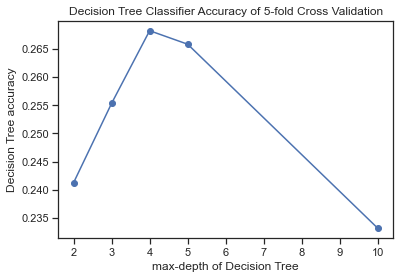

In [204]:
plt.plot(depths, clf.cv_results_['mean_test_score'], 'bo-')
plt.xlabel('max-depth of Decision Tree')
plt.ylabel('Decision Tree accuracy')
plt.title('Decision Tree Classifier Accuracy of 5-fold Cross Validation')
plt.show() 

In [205]:
best_clf = DecisionTreeClassifier(max_depth=4, random_state=27).fit(X_train, y_train)
acc = best_clf.score(X_test,y_test)
print("Test accuracy for the best fit model is: %.3f"%acc)

Test accuracy for the best fit model is: 0.254


Test accuracy for the best fit model is: 0.254


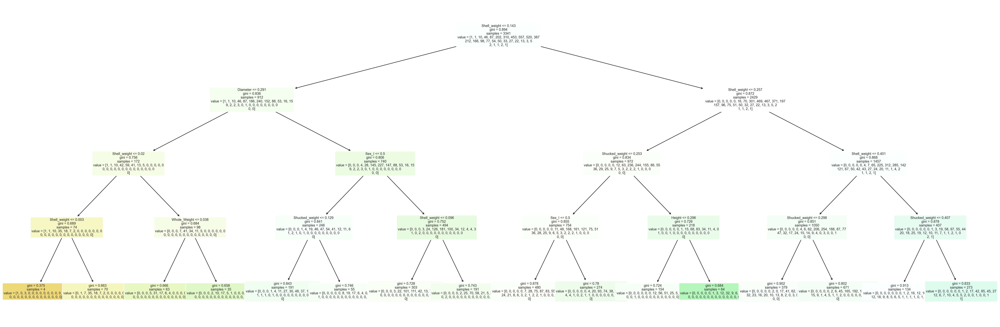

In [88]:
#visualizing the decision tree to analyse splitting rules
features = X_abalone.columns.tolist()
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (36,12), dpi=300)
tree.plot_tree(best_clf,feature_names=features,filled=True,fontsize=7,rounded=True)
plt.show()

- The Decition Tree visualization essentially represents the features and the values of the said feature that were used to split the data and form branches. The last node without any split acts as the leaf node. And the minimum number of samples required to be at a leaf node = 1 in default case.

- Since we used default values, the function to measure the quality of a split is taken as gini impurity value. The higher value of gini impurity indicates that the node is impure and hence it can be further split. The best split is done on the node until lowest (or 0) value of Gini impurity is reached or max_depth is reached, as it means that the node will be pure [17].

- The graph started by splitting the data from root node which is shell_weight<=0.143, which is then split into shell_weight<=0.257 on the right and diameter<=0.291 on the left. Now these nodes are further split by using other features in the data. The overall tree is symmetrically split.

- Also, what is interersting from the plot is that most of the features that were used to split the data are shell weight, whole weight, shucked weight which repeaed many times. While diameter, height and sex are rarely used.

### Decision Trees Classifier on PCA Abalone Data

In [206]:
# DT on the PCA dataset
DT_clf = DecisionTreeClassifier(random_state=27)
depths = [2, 3, 4, 5, 10]
parameters = {'max_depth': depths}
clf = GridSearchCV(DT_clf, parameters, cv=5).fit(X_abalone_pca_train , y_train)
print(clf.best_params_)

{'max_depth': 4}


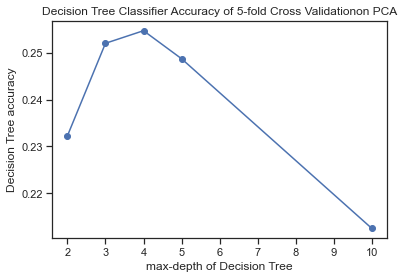

In [207]:
plt.plot(depths, clf.cv_results_['mean_test_score'], 'bo-')
plt.xlabel('max-depth of Decision Tree')
plt.ylabel('Decision Tree accuracy')
plt.title('Decision Tree Classifier Accuracy of 5-fold Cross Validationon PCA')
plt.show() 

Now, we fit the model for best obtained max_depth and ovserve test accuracy.

In [208]:
best_clf = DecisionTreeClassifier(max_depth=4, random_state=27).fit(X_abalone_pca_train, y_train)
acc = best_clf.score(X_abalone_pca_test,y_test)
print("Test accuracy for the best fit PCA model is: %.3f"%acc)

Test accuracy for the best fit PCA model is: 0.269


### Decision Trees Classifier on LDA Abalone Data

In [209]:
# DT on the LDA dataset
DT_clf = DecisionTreeClassifier(random_state=27)
depths = [2, 3, 4, 5, 10]
parameters = {'max_depth': depths}
clf = GridSearchCV(DT_clf, parameters, cv=5).fit(X_abalone_lda_train , y_train)
print(clf.best_params_)

{'max_depth': 3}


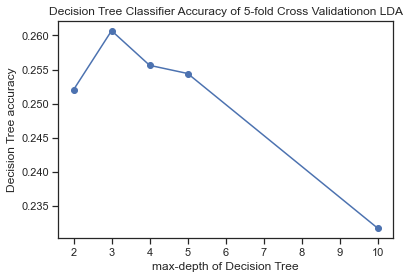

In [210]:
plt.plot(depths, clf.cv_results_['mean_test_score'], 'bo-')
plt.xlabel('max-depth of Decision Tree')
plt.ylabel('Decision Tree accuracy')
plt.title('Decision Tree Classifier Accuracy of 5-fold Cross Validationon LDA')
plt.show() 

Now, we fit the model for best obtained max_depth and ovserve test accuracy.

In [211]:
best_clf = DecisionTreeClassifier(max_depth=3, random_state=27).fit(X_abalone_lda_train, y_train)
acc = best_clf.score(X_abalone_lda_test,y_test)
print("Test accuracy for the best fit LDA model is: %.3f"%acc)

Test accuracy for the best fit LDA model is: 0.254


## 4 Random Forest Classifier

### Random Forest Classification on raw abalone dataset
Performing Random Forest Classification on raw abalone dataset to obtain best set of parameters.

Here we are choosing max_depth and n_estimators i.e numer of trees to be the parameters that need to be tunes. Although larger number of trees maybe better, but will take much longer to compute, additionlly the results will stop getting significantly better beyond a critical number of trees. 

In [214]:
RF_clf = RandomForestClassifier(random_state=27)
depths = [2, 3, 4, 5, 10]
n_trees = [3, 5, 10, 20, 50, 100, 150, 200, 250, 300]
parameters = {'n_estimators': n_trees, 'max_depth':depths}
clf = GridSearchCV(RF_clf, parameters, cv=5).fit(X_train, y_train)
print(clf.best_params_)

{'max_depth': 5, 'n_estimators': 250}


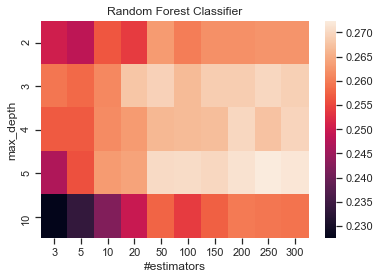

In [215]:
grid_results = clf.cv_results_['mean_test_score'].reshape([len(depths), len(n_trees)])
sns.heatmap(grid_results, xticklabels=n_trees, yticklabels=depths)
plt.ylabel('max_depth')
plt.xlabel('#estimators')
plt.title('Random Forest Classifier')
plt.show()

We see from the heat plot that the best accuracy is obtained when max_depth is 5 and number of trees are 250. And hence we fit the model once again for the best parameter settings and observe the test accuracy.

In [216]:
best_clf = RandomForestClassifier(max_depth=5, n_estimators=250, random_state=27).fit(X_train, y_train)
acc = best_clf.score(X_test,y_test)
print("Test accuracy for the best fit model is: %.3f"%acc)

Test accuracy for the best fit model is: 0.273


### Random Forest Classification on PCA abalone dataset

Same analysis is done on PCA and LDA abalone dataset.

In [217]:
# RF on the PCA dataset
clf = GridSearchCV(RF_clf, parameters, cv=5).fit(X_abalone_pca_train , y_train)
print(clf.best_params_)

{'max_depth': 3, 'n_estimators': 250}


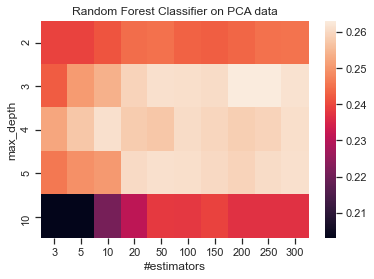

In [218]:
grid_results = clf.cv_results_['mean_test_score'].reshape([len(depths), len(n_trees)])
sns.heatmap(grid_results, xticklabels=n_trees, yticklabels=depths)
plt.ylabel('max_depth')
plt.xlabel('#estimators')
plt.title('Random Forest Classifier on PCA data')
plt.show()

We see from the heat plot that the best accuracy is obtained when max_depth is 3 and number of trees are 250. And hence we fit the model once again for the best parameter settings and observe the test accuracy.

In [220]:
best_clf = RandomForestClassifier(max_depth=3, n_estimators=250, random_state=27).fit(X_abalone_pca_train, y_train)
acc = best_clf.score(X_abalone_pca_test,y_test)
print("Test accuracy for the best fit PCA model is: %.3f"%acc)

Test accuracy for the best fit PCA model is: 0.275


### Random Forest Classification on LDA abalone dataset

In [221]:
# RF on the LDA dataset
clf = GridSearchCV(RF_clf, parameters, cv=5).fit(X_abalone_lda_train , y_train)
print(clf.best_params_)

{'max_depth': 4, 'n_estimators': 100}


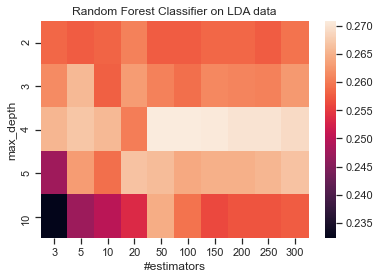

In [222]:
grid_results = clf.cv_results_['mean_test_score'].reshape([len(depths), len(n_trees)])
sns.heatmap(grid_results, xticklabels=n_trees, yticklabels=depths)
plt.ylabel('max_depth')
plt.xlabel('#estimators')
plt.title('Random Forest Classifier on LDA data')
plt.show()

We see from the heat plot that the best accuracy is obtained when max_depth is 4 and number of trees are 100. And hence we fit the model once again for the best parameter settings and observe the test accuracy.

In [223]:
best_clf = RandomForestClassifier(max_depth=4, n_estimators=100, random_state=27).fit(X_abalone_lda_train, y_train)
acc = best_clf.score(X_abalone_lda_test,y_test)
print("Test accuracy for the best fit LDA model is: %.3f"%acc)

Test accuracy for the best fit LDA model is: 0.274


## 5 Gradient Tree Boosting

Gradient Boosting is used on the data using scikit learn [16].

### Gradient Tree Boosting on raw abalone dataset

Performing Gradient Tree Boosting on raw abalone dataset to obtain best set of parameters.

Here we are choosing max_depth and n_estimators i.e numer of trees to be the parameters that need to be tuned. 

In [225]:
GB_clf = GradientBoostingClassifier(random_state=27)
n_trees = [3, 5, 10, 20, 50, 100]
depths = [2, 3, 4, 5, 10]
parameters = {'n_estimators': n_trees, 'max_depth':depths}
clf = GridSearchCV(GB_clf, parameters, verbose=0, cv=5).fit(X_train, y_train)
print(clf.best_params_)

{'max_depth': 2, 'n_estimators': 5}


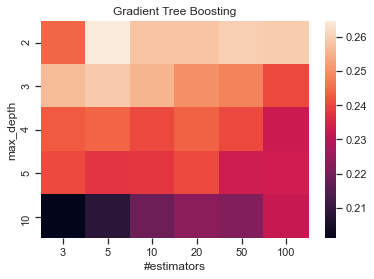

In [226]:
grid_results = clf.cv_results_['mean_test_score'].reshape([len(depths), len(n_trees)])
sns.heatmap(grid_results, xticklabels=n_trees, yticklabels=depths)
plt.ylabel('max_depth')
plt.xlabel('#estimators')
plt.title('Gradient Tree Boosting')
plt.show()

We see from the heat plot that the best accuracy is obtained when max_depth is 2 and number of trees are 5. And hence we fit the model once again for the best parameter settings and observe the test accuracy.

In [233]:
best_clf = GradientBoostingClassifier(max_depth=2, n_estimators=5, random_state=27).fit(X_train, y_train)
acc = best_clf.score(X_test,y_test)
print("Test accuracy for the best fit model is: %.3f"%acc)

Test accuracy for the best fit model is: 0.257


### Gradient Tree Boosting on PCA abalone dataset

In [227]:
# on the PCA data
GB_clf = GradientBoostingClassifier(random_state=27)
n_trees = [3, 5, 10, 15]
depths = [2, 3, 4, 5, 10]
parameters = {'n_estimators': n_trees, 'max_depth':depths}
clf = GridSearchCV(GB_clf, parameters, cv=5).fit(X_abalone_pca_train , y_train)
print(clf.best_params_)

{'max_depth': 2, 'n_estimators': 10}


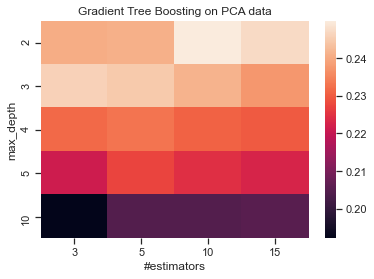

In [228]:
grid_results = clf.cv_results_['mean_test_score'].reshape([len(depths), len(n_trees)])
sns.heatmap(grid_results, xticklabels=n_trees, yticklabels=depths)
plt.ylabel('max_depth')
plt.xlabel('#estimators')
plt.title('Gradient Tree Boosting on PCA data')
plt.show()

We see from the heat plot that the best accuracy is obtained when max_depth is 2 and number of trees are 10. And hence we fit the model once again for the best parameter settings and observe the test accuracy.

In [232]:
best_clf = GradientBoostingClassifier(max_depth=2, n_estimators=10, random_state=27).fit(X_abalone_pca_train, y_train)
acc = best_clf.score(X_abalone_pca_test,y_test)
print("Test accuracy for the best fit PCA model is: %.3f"%acc)

Test accuracy for the best fit PCA model is: 0.262


### Gradient Tree Boosting on LDA abalone dataset

In [229]:
# on the LDA data
GB_clf = GradientBoostingClassifier(random_state=27)
n_trees = [3, 5, 10, 15]
depths = [2, 3, 4, 5, 10, 15]
parameters = {'n_estimators': n_trees, 'max_depth':depths}
clf = GridSearchCV(GB_clf, parameters, cv=5).fit(X_abalone_lda_train , y_train)
print(clf.best_params_)

{'max_depth': 2, 'n_estimators': 15}


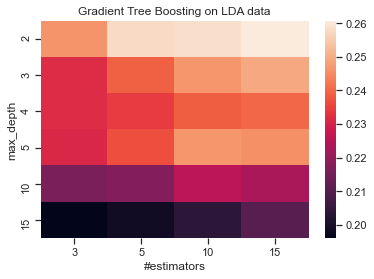

In [230]:
grid_results = clf.cv_results_['mean_test_score'].reshape([len(depths), len(n_trees)])
sns.heatmap(grid_results, xticklabels=n_trees, yticklabels=depths)
plt.ylabel('max_depth')
plt.xlabel('#estimators')
plt.title('Gradient Tree Boosting on LDA data')
plt.show()

We see from the heat plot that the best accuracy is obtained when max_depth is 2 and number of trees are 15. And hence we fit the model once again for the best parameter settings and observe the test accuracy.

In [231]:
best_clf = GradientBoostingClassifier(max_depth=2, n_estimators=15, random_state=27).fit(X_abalone_lda_train, y_train)
acc = best_clf.score(X_abalone_lda_test,y_test)
print("Test accuracy for the best fit LDA model is: %.3f"%acc)

Test accuracy for the best fit LDA model is: 0.276


The analysis is repeated for PCA and LDA Abalone data as well. And we see that gradient boosting classification performs much better and at a lower depths and using less number of trees than Random Forest classification for all (raw/PCA/LDA) the three datasets.

## 6 Final Results

The tables below contain the test accuracies for all the above done analysis.

Wine Data set:
- Best classification accuracy for the Wine dataset is obtained for KNN on PCA data set which is then followed by the Random Forest Classifier on the Raw dataset. 

- For naive bayes, the accuracies are lower than other classifiers, we think this may be because naive bayes assumes conditional independence of the features but for our data, the feature dependency is more for our dataset.

- The dimensionality reduction has benefitted classification accuracy in some settings. This could be because the algorithm was able to find patterns much easily by ignoring noise.

Abalone Data set:
- Best classification accuracy for the Abalone dataset is obtained by the KNN Classifier on the LDA dataset. 

- For naive bayes, the accuracies are varying. Gaussian naive bayes performs better than multinomial and complement for PCA and LDA data.

- The dimensionality reduction has definately benifited the dataset, as the accuracies are higher for PCA and LDA data than RAW data in many settings.


#### Wine Dataset
|Classifier  | Setting   | wine-raw      | wine-pca    | wine-lda      |
|------------|-----------|---------------|-------------|---------------|
|kNN         | k = 40     | 68.8 | 69.4 | 67.0 |
|Naive Bayes|GaussianNB| 33.4 | 50.1 | 53.7|
|Multinomial Naive Bayes|MultinomialNB| 47.1 | 43.8 | 43.8 |
|Complement Naive Bayes|ComplementNB| 41.4 | 45.7 | 43.4 |
|Decision Tree Classifier| max_depth=30(raw,lda) 25(pca) | 58.7 | 58.1 | 57.7 |
|Random Forest Classifier | max_depth=25, n_estimators=250 (raw,lda) 20, 300 (pca)  | 69.2 | 68.4 | 68.3 |
|Gradient Tree Boosting| max_depth=15, n_estimators=150 (raw,lda,pca)  | 69 | 65.7 | 66.9 |


#### Abalone Dataset
|Classifier  | Setting   | Abalone-raw      | Abalone-pca    | Abalone-lda      |
|------------|-----------|---------------|-------------|---------------|
|kNN         | k = 65     | 27.8 | 26.9 | 28.7 |
|Naive Bayes|GaussianNB| 10.2 | 26.5 | 28.1 |
|Multinomial Naive Bayes|MultinomialNB| 20.09 | 16.38 | 15.78 |
|Complement Naive Bayes|ComplementNB| 18.18 | 17.7 | 19.25|
|Decision Tree Classifier| max_depth=4 (raw,pca) 3(lda) |25.4 | 26.9 | 25.4|
|Random Forest Classifier | max_depth=5, n_estimators=250 (raw) 3,250 (pca) 4,100 (lda) | 27.3 | 27.5 | 27.4 |
|Gradient Tree Boosting| max_depth=2, n_estimators=5 (raw) 2,10 (pca) 2,15 (lda) | 25.7 | 26.2 | 27.6 |

### References
[1]. Min-Max Scalar: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html

[2]. PCA: https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html

[3]. How to use PCA: https://towardsdatascience.com/dealing-with-highly-dimensional-data-using-principal-component-analysis-pca-fea1ca817fe6

[4]. LDA: https://scikit-learn.org/stable/modules/generated/sklearn.discriminant_analysis.LinearDiscriminantAnalysis.html

[5]. T-SNE: https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html

[6]. PCA Scree Plot: https://www.statology.org/scree-plot-python/

[7]. Niave Bayes: https://www.janbasktraining.com/blog/naive-bayes/

[8]. Gaussian naive bayes: https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html#sklearn.naive_bayes.GaussianNB

[9]. Multinomial naive bayes: https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html#sklearn.naive_bayes.MultinomialNB

[10]. Complement naive bayes: https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.ComplementNB.html#sklearn.naive_bayes.ComplementNB
        
[11]. Cross validation score: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_score.html?highlight=cross%20val%20score#sklearn.model_selection.cross_val_score

[12]. Grid search cv: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html

[13]. Decision tree classifier: https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html?highlight=decision%20tree#sklearn.tree.DecisionTreeClassifier

[14]. Random forest classification: https://towardsdatascience.com/understanding-random-forest-58381e0602d2

[15]. Random forest classifier sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html?highlight=random%20forest#sklearn.ensemble.RandomForestClassifier

[16]. Gradient tree boosting: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html?highlight=gradient%20boost#sklearn.ensemble.GradientBoostingClassifier

[17]. Gini impurity: https://www.analyticsvidhya.com/blog/2021/03/how-to-select-best-split-in-decision-trees-gini-impurity/

[18]. Max_depth limit for decision tree: https://towardsdatascience.com/how-to-tune-a-decision-tree-f03721801680

[19]. Seaborn color palette used for scatterplot: https://seaborn.pydata.org/tutorial/color_palettes.html

[20]. Scatter plot used for 2D data visualization: https://seaborn.pydata.org/generated/seaborn.scatterplot.html
